In [ ]:
import torch
import torchvision.models as models
import torchvision.transforms as transforms
import torchvision
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import time
import cv2

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_ft = models.vgg19(pretrained=True)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:07<00:00, 79.4MB/s]


# Exploring VGG16

In [ ]:
print(model_ft)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

In [ ]:
list(model_ft.features.children())[0]

Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [ ]:
img = Image.open('/content/lion_img.jpeg')

In [ ]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

In [ ]:
np.array(img).shape

(148, 234, 3)

In [ ]:
transform = transforms.Compose([
    transforms.PILToTensor()
])

img_tensor = transform(img)


In [ ]:
print(img_tensor)

tensor([[[63, 64, 65,  ..., 86, 83, 83],
         [64, 64, 66,  ..., 87, 84, 84],
         [67, 68, 69,  ..., 88, 85, 85],
         ...,
         [19, 19, 21,  ..., 67, 67, 67],
         [19, 19, 21,  ..., 66, 67, 67],
         [20, 19, 20,  ..., 66, 66, 66]],

        [[33, 34, 35,  ..., 47, 44, 44],
         [34, 34, 36,  ..., 48, 45, 45],
         [34, 35, 36,  ..., 49, 46, 46],
         ...,
         [ 9,  9,  8,  ..., 42, 42, 42],
         [ 9,  9,  8,  ..., 41, 42, 42],
         [10,  9,  7,  ..., 41, 41, 41]],

        [[ 0,  0,  1,  ..., 16, 13, 13],
         [ 0,  0,  2,  ..., 17, 14, 14],
         [ 1,  2,  3,  ..., 18, 15, 15],
         ...,
         [ 0,  0,  0,  ..., 22, 22, 22],
         [ 0,  0,  0,  ..., 21, 22, 22],
         [ 1,  0,  0,  ..., 21, 21, 21]]], dtype=torch.uint8)


In [ ]:
intermediate_tensor = model_ft.features[:22](img_tensor.type(torch.float32))

In [ ]:
def get_features(name):
    def hook(model, input, output):
        features[name] = output.detach()
    return hook

In [ ]:
model_ft.features[14].register_forward_hook(get_features('feats'))

In [ ]:
features = {}
preds = model_ft(img_tensor.type(torch.float32))
features['feats'].cpu().numpy()

RuntimeError: mat1 and mat2 shapes cannot be multiplied (512x49 and 25088x4096)

In [ ]:
intermediate_tensor.shape

torch.Size([512, 18, 29])

In [ ]:
intermediate_tensor = intermediate_tensor.cpu().detach().numpy()

In [ ]:
for i in range(512):
  plt.imshow(intermediate_tensor[150,:,:])
  plt.show()
  # time.sleep(2)

In [ ]:
'Conv2d' in str(model_ft.features[21])

True

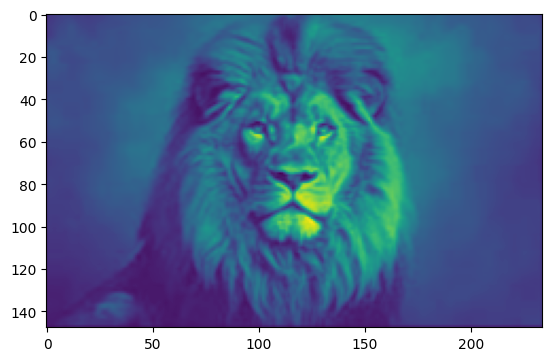

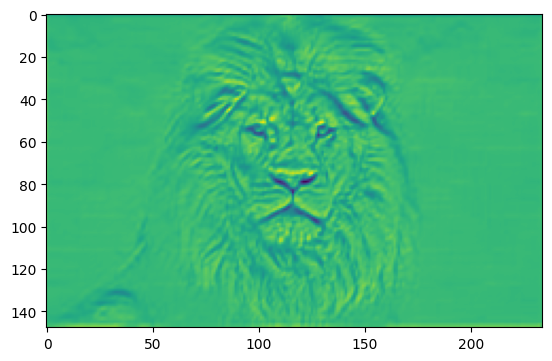

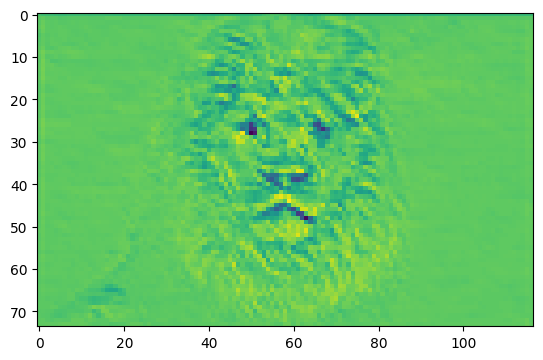

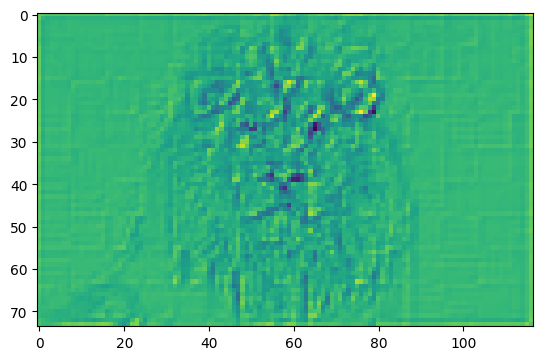

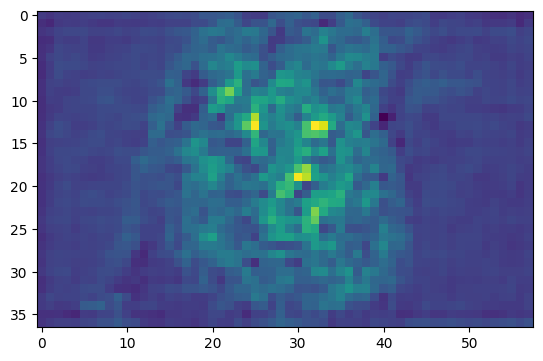

...

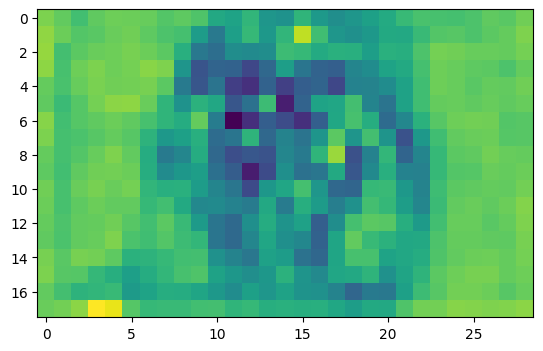

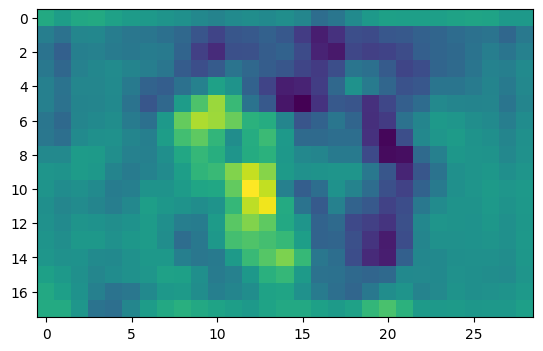

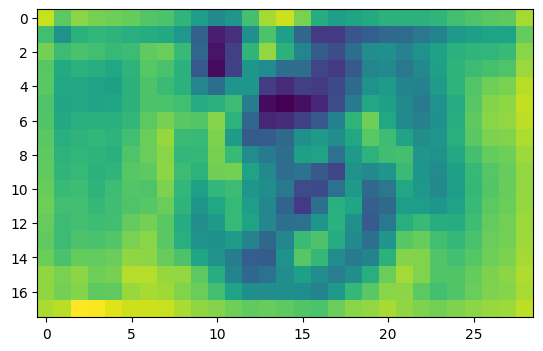

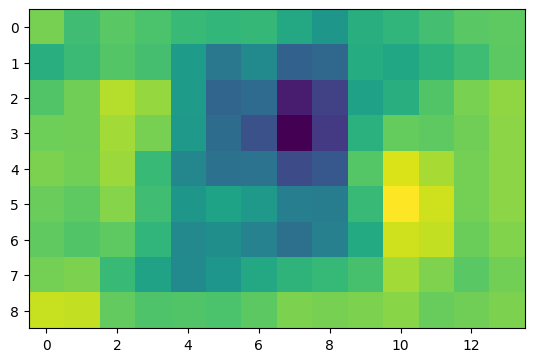

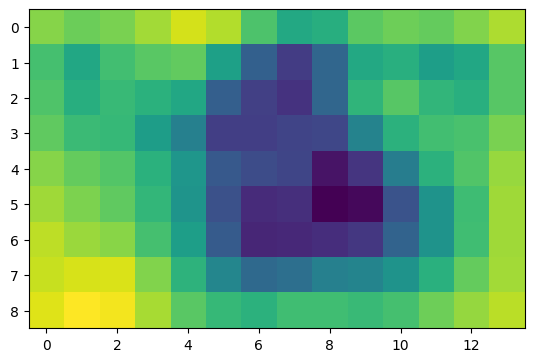

In [ ]:
for i in range(31):
  if 'Conv2d' in str(model_ft.features[i]):
    intermediate_tensor = model_ft.features[:i+1](img_tensor.type(torch.float32))
    intermediate_tensor = intermediate_tensor.cpu().detach().numpy()
    # plt.subplot(1,2,1)
    plt.imshow(intermediate_tensor[0,:,:])
    # plt.subplot(1,2,2)
    # img = Image.open('/content/lion_img.jpeg')
    # plt.imshow(plt.imshow(np.array(img)))
    plt.show()

In [ ]:
for name, layer in model_ft.features._modules.items():
  print(name)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30


# NST

In [ ]:
# style_layers, content_layers = [0, 5, 10, 19, 28], [25]

style_layers, content_layers = [0, 5, 10, 19, 28], [0, 5, 10]

In [ ]:
net = torch.nn.Sequential(*[model_ft.features[i] for i in range(max(style_layers + content_layers) + 1)]).to(device)

In [ ]:
rgb_mean = torch.tensor([0.485, 0.456, 0.406])
rgb_std = torch.tensor([0.229, 0.224, 0.225])

def preprocess(img, image_shape):
    transforms = torchvision.transforms.Compose([
        torchvision.transforms.Resize(image_shape[::-1]),
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize(mean=rgb_mean, std=rgb_std)])
    return transforms(img).unsqueeze(0)

def postprocess(img):
    img = img[0].to(rgb_std.device)
    img = torch.clamp(img.permute(1, 2, 0) * rgb_std + rgb_mean, 0, 1)
    return torchvision.transforms.ToPILImage()(img.permute(2, 0, 1))

In [ ]:
def get_features(X, net, style_layers, content_layers):
  style_features = []
  content_features = []

  for i in range(len(net)):
    X = net[i](X)

    if i in style_layers:
      style_features.append(X)

    if i in content_layers:
      content_features.append(X)

  return style_features, content_features

In [ ]:
def content_loss(Y_hat, Y):
  return torch.square(Y_hat - Y.detach()).mean()

In [ ]:
def gram(X):
    num_channels, n = X.shape[1], X.numel() // X.shape[1]
    X = X.reshape((num_channels, n))
    return torch.matmul(X, X.T) / (num_channels * n)

In [ ]:
def style_loss(Y_hat, gram_Y):
    return torch.square(gram(Y_hat) - gram_Y.detach()).mean()

In [ ]:
# total variation loss
def tv_loss(Y_hat):
    return 0.5 * (torch.abs(Y_hat[:, :, 1:, :] - Y_hat[:, :, :-1, :]).mean() +
                  torch.abs(Y_hat[:, :, :, 1:] - Y_hat[:, :, :, :-1]).mean())

### Worked best
0.2, 1e5, 50

In [ ]:
content_weight, style_weight, tv_weight = 0.05, 1e5, 50

def compute_loss(X, contents_Y_hat, styles_Y_hat, contents_Y, styles_Y_gram):
    # Calculate the content, style, and total variance losses respectively
    contents_l = [content_loss(Y_hat, Y) * content_weight for Y_hat, Y in zip(
        contents_Y_hat, contents_Y)]
    styles_l = [style_loss(Y_hat, Y) * style_weight for Y_hat, Y in zip(
        styles_Y_hat, styles_Y_gram)]
    tv_l = tv_loss(X) * tv_weight
    # Add up all the losses
    l = sum(styles_l + contents_l + [tv_l])
    return contents_l, styles_l, tv_l, l

In [ ]:
class SynthesizedImage(torch.nn.Module):
  def __init__(self, img_shape, **kwargs):
    super(SynthesizedImage, self).__init__(**kwargs)
    self.weight = torch.nn.Parameter(torch.rand(*img_shape))

  def forward(self):
    return self.weight

In [ ]:
def get_inits(X, device, lr, styles_Y):
  gen_img = SynthesizedImage(X.shape).to(device)
  gen_img.weight.data.copy_(X.data)
  trainer = torch.optim.Adam(gen_img.parameters(), lr=lr)
  # trainer = torch.optim.LBFGS(gen_img.parameters(), history_size=10, max_iter=4)
  styles_Y_gram = [gram(y) for y in styles_Y]
  return gen_img(), styles_Y_gram, trainer

In [ ]:
def train(X, contents_Y, styles_Y, device, lr, num_epochs, lr_decay_epoch):
  X, styles_Y_gram, trainer = get_inits(X,device,lr, styles_Y)
  scheduler = torch.optim.lr_scheduler.StepLR(trainer, lr_decay_epoch, 0.8)
  for epoch in range(num_epochs):
    trainer.zero_grad()

    contents_Y_hat, styles_Y_hat = get_features(X, net, style_layers, content_layers)

    contents_l, styles_l, tv_l, l = compute_loss(X, contents_Y_hat, styles_Y_hat, contents_Y, styles_Y_gram)

    l.backward()

    # def closure():
    #     # if torch.is_grad_enabled():
    #     trainer.zero_grad()

    #     contents_l, styles_l, tv_l, l = compute_loss(X, contents_Y_hat, styles_Y_hat, contents_Y, styles_Y_gram)
    #     if l.requires_grad:
    #       l.backward(retain_graph=True)
    #     return l

    trainer.step()

    if (epoch + 1)%50 == 0:
      print('EPOCH ->', epoch+1)
      temp_img = postprocess(X)
      plt.imshow(temp_img)
      plt.show()

  return X

In [ ]:
content_img = Image.open('/content/WhatsApp Image 2024-01-21 at 21.04.06.jpeg')
print(content_img.size)
print(float(content_img.size[1]) / content_img.size[0])
content_img.thumbnail((960 / (float(content_img.size[1]) / content_img.size[0] * i), 1280 / (float(content_img.size[1]) / content_img.size[0] * i)), Image.Resampling.LANCZOS)
content_img.save('resized_img', "JPEG")

In [ ]:
style_img = Image.open('/content/stary_night.jpeg')
print(style_img.size)

(252, 200)


In [ ]:
i = 3
960 / (float(content_img.size[1]) / content_img.size[0] * i), 1280 / (float(content_img.size[1]) / content_img.size[0] * i)

(240.0, 320.0)

EPOCH -> 50


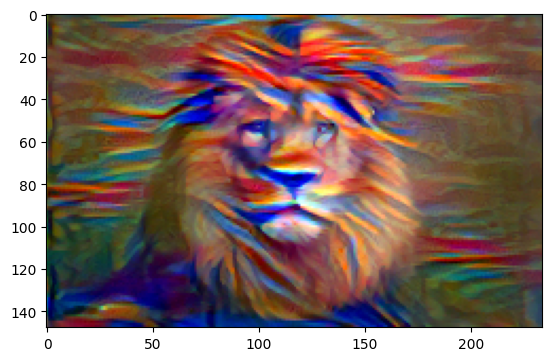

EPOCH -> 100


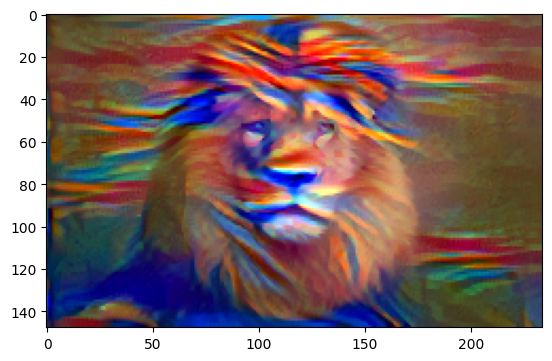

EPOCH -> 150


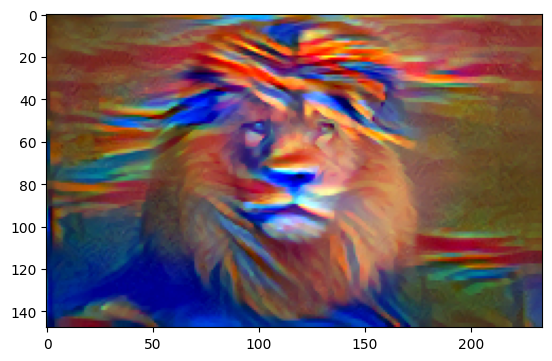

EPOCH -> 200


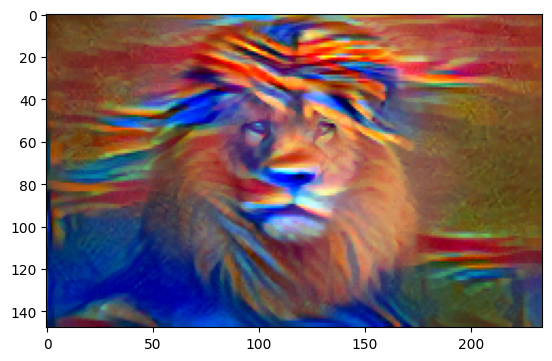

EPOCH -> 250


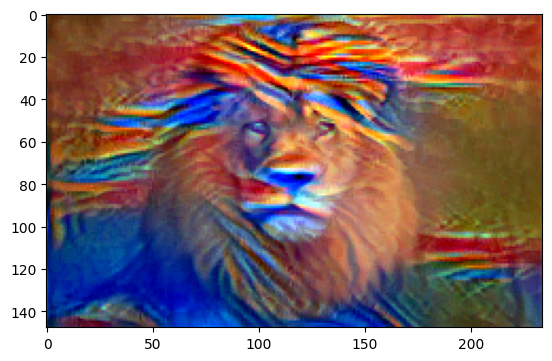

EPOCH -> 300


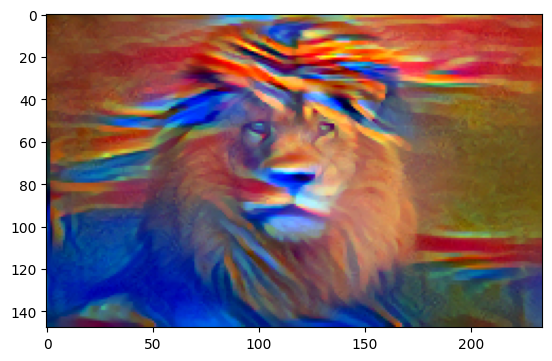

EPOCH -> 350


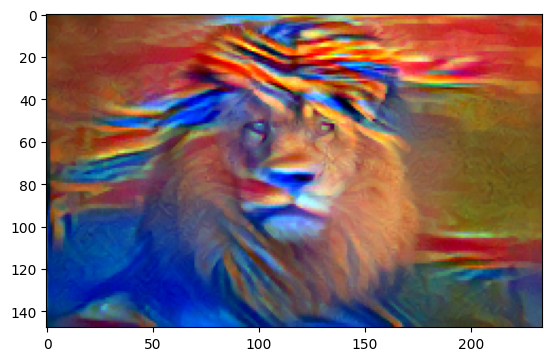

EPOCH -> 400


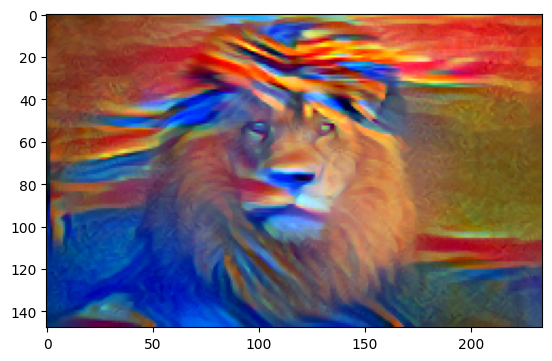

EPOCH -> 450


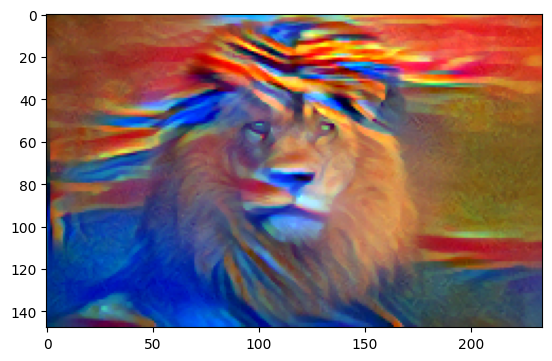

EPOCH -> 500


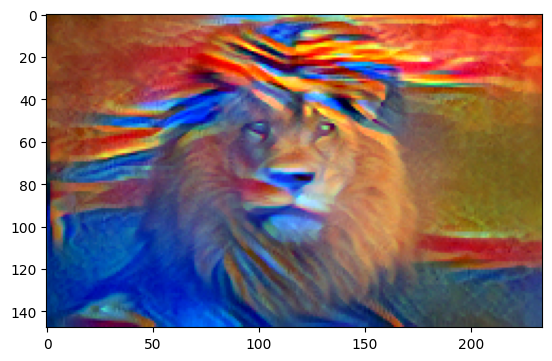

EPOCH -> 550


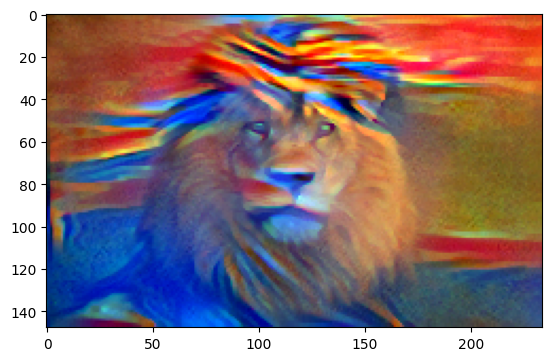

EPOCH -> 600


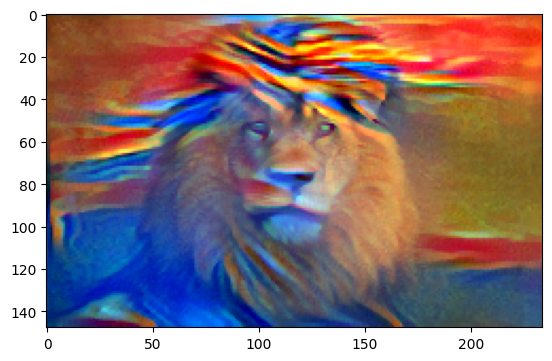

EPOCH -> 650


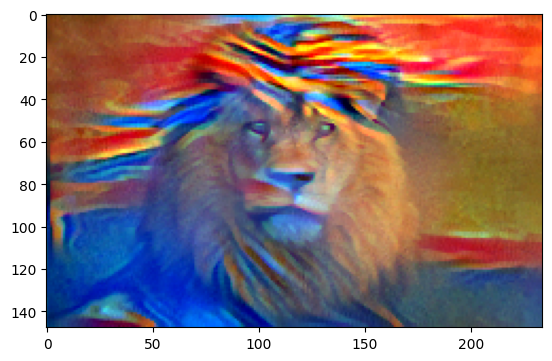

EPOCH -> 700


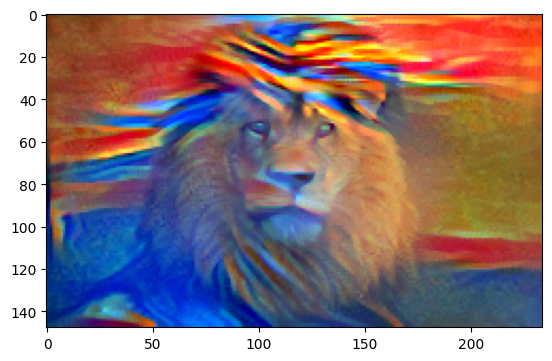

EPOCH -> 750


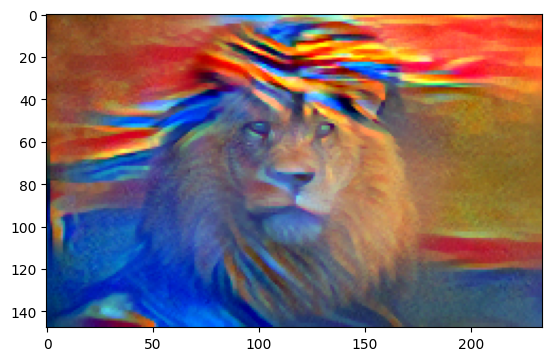

EPOCH -> 800


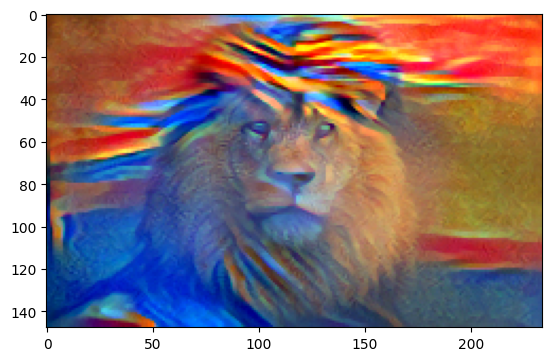

EPOCH -> 850


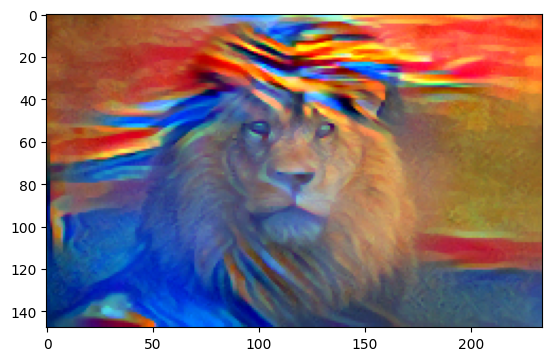

EPOCH -> 900


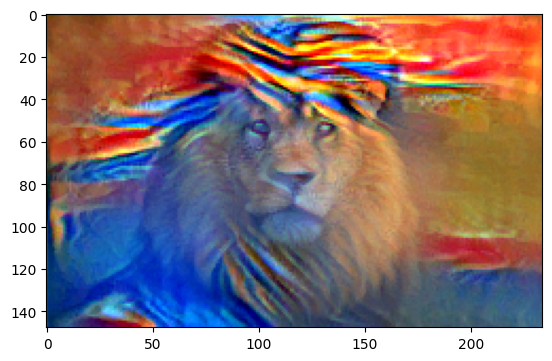

EPOCH -> 950


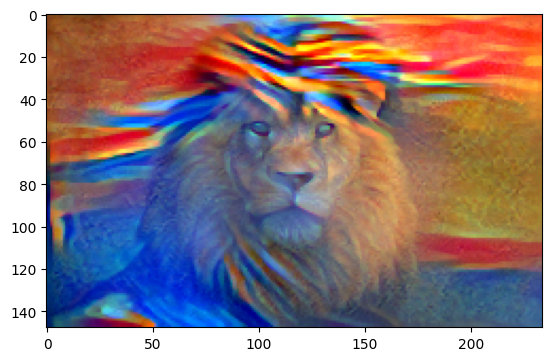

EPOCH -> 1000


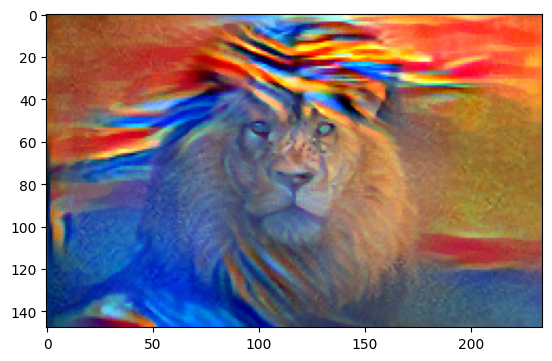

In [ ]:
content_img = Image.open('/content/lion_img.jpeg')
image_shape = tuple(np.array(content_img.size))
style_img = Image.open('/content/scream.jpeg')


content_X = preprocess(content_img, image_shape).to(device)
contents_Y, _ = get_features(content_X, net, style_layers,content_layers)

style_X = preprocess(style_img, image_shape).to(device)
_, styles_Y = get_features(style_X, net, style_layers, content_layers)

output = train(content_X, contents_Y, styles_Y, device, 0.3, 1000,50)

In [ ]:
content_img.size

(240, 320)

In [ ]:
out_img = postprocess(output)

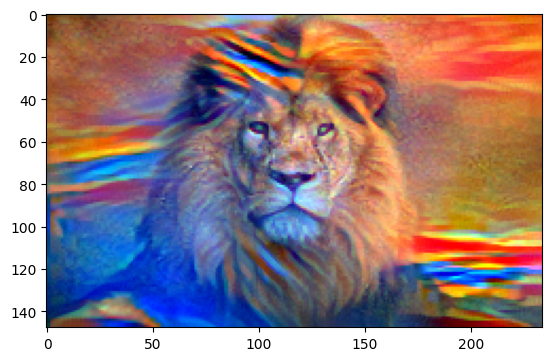

In [ ]:
# scream
plt.imshow(out_img)

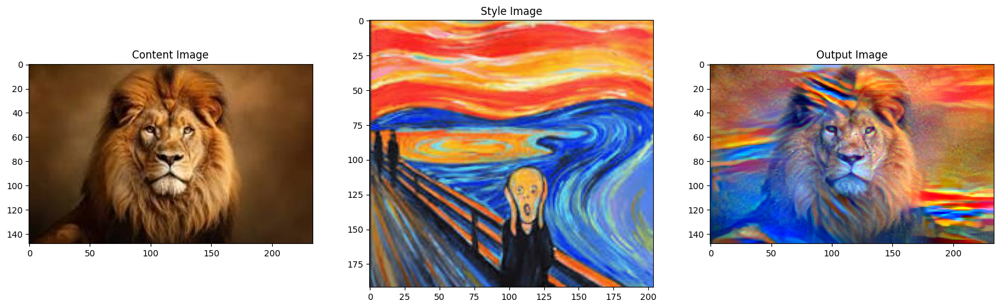

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.imshow(content_img)
plt.title('Content Image')

plt.subplot(1,3,2)
plt.imshow(style_img)
plt.title('Style Image')

plt.subplot(1,3,3)
plt.imshow(out_img)
plt.title('Output Image')

plt.savefig('Example2.jpeg')

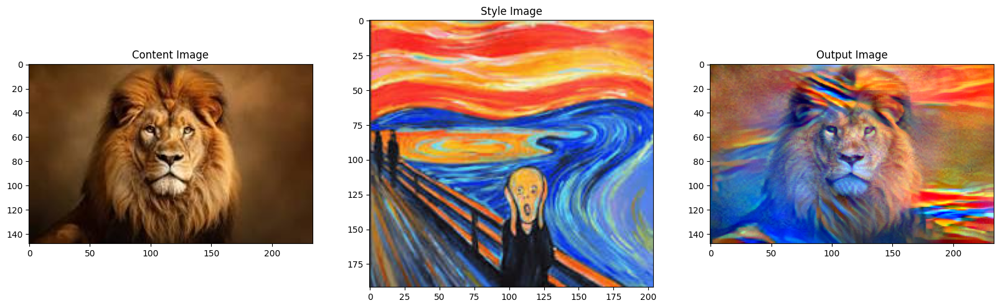

In [ ]:
plt.figure(figsize=(20,10))

plt.subplot(1,3,1)
plt.imshow(content_img)
plt.title('Content Image')

plt.subplot(1,3,2)
plt.imshow(style_img)
plt.title('Style Image')

plt.subplot(1,3,3)
plt.imshow(out_img)
plt.title('Output Image')

plt.savefig('Example2.jpeg')

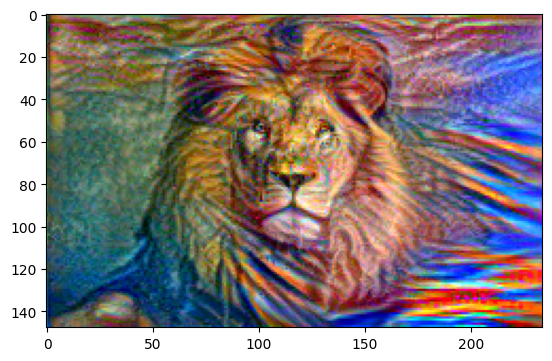

In [ ]:
# scream
plt.imshow(out_img)

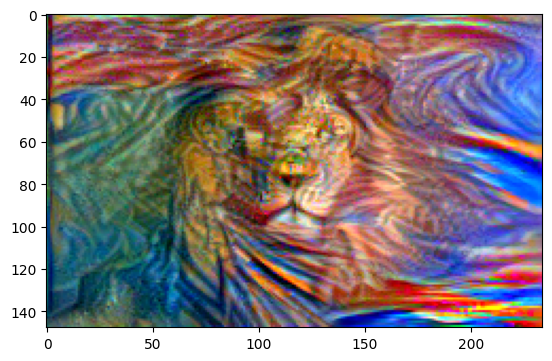

In [ ]:
# scream
plt.imshow(out_img)

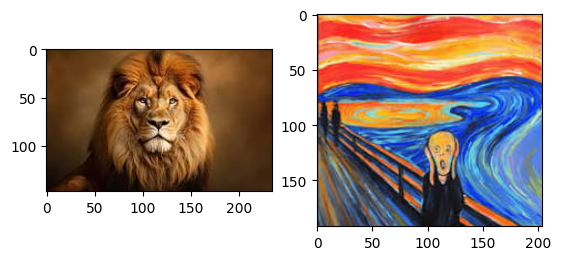

In [ ]:
plt.subplot(1,2,1)
plt.imshow(content_img)

plt.subplot(1,2,2)
plt.imshow(style_img)

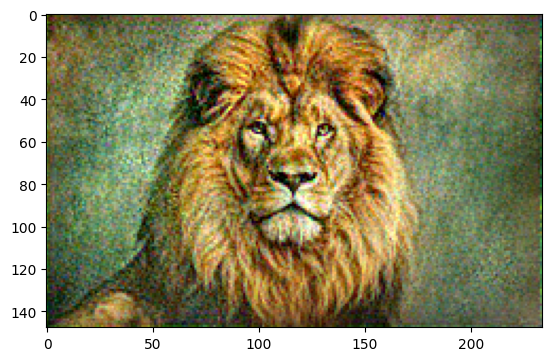

In [ ]:
# stary night
plt.imshow(out_img)

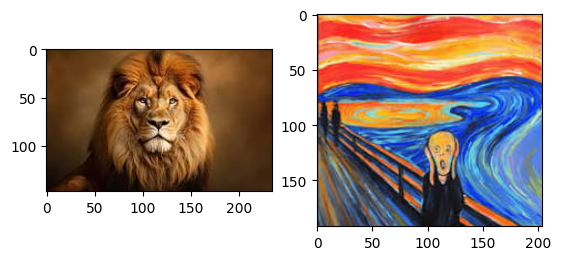

In [ ]:
plt.subplot(1,2,1)
plt.imshow(content_img)

plt.subplot(1,2,2)
plt.imshow(style_img)